In [1]:
import sys
sys.path.append("/scratch/group/csce435-f24/python-3.10.4/lib/python3.10/site-packages")
sys.path.append("/scratch/group/csce435-f24/thicket")
from glob import glob

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

In [2]:
#1_trial is a name of a folder containing the cali files, you may create a folder with a different name and replace the folder name here
tk = th.Thicket.from_caliperreader(glob("caliFiles/*.cali"))

(2/2) Creating Thicket: 100%|██████████| 251/251 [00:07<00:00, 34.41it/s]


In [ ]:
tk.show_metric_columns()

In [3]:
metadata_df = tk.metadata.copy()

metadata_df['input_type'] = metadata_df.apply(lambda x: x['cmdline'][2], axis=1)
tk.metadata = metadata_df.copy()

In [4]:
tk.metadata_column_to_perfdata("input_size")
tk.metadata_column_to_perfdata("num_procs")
tk.metadata_column_to_perfdata("input_type")

In [5]:
input_sizes = sorted(tk.metadata["input_size"].unique())
num_procs = sorted(tk.metadata["num_procs"].unique())
input_types = sorted(tk.metadata["input_type"].unique())

In [6]:
print(tk.tree(metric_column="Max time/rank"))

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2024.1.0

1.541 main
├─ 0.046 MPI_Comm_dup
├─ 0.000 MPI_Finalize
├─ 0.000 MPI_Finalized
├─ 0.000 MPI_Init
├─ 0.000 MPI_Initialized
├─ 0.028 comm
│  └─ 0.028 comm_large
│     ├─ 0.020 MPI_Recv
│     └─ 0.008 MPI_Send
├─ 0.006 comp
│  ├─ 0.001 comp_large
│  └─ 0.005 comp_small
├─ 0.001 correctness_check
└─ 0.000 data_init_local

Legend (Metric: Max time/rank Min: 0.00 Max: 1.54 indices: {'profile': 545548})
█ 1.39 - 1.54
█ 1.08 - 1.39
█ 0.77 - 1.08
█ 0.46 - 0.77
█ 0.15 - 0.46
█ 0.00 - 0.15

name User code    ◀  Only in left graph    ▶  Only in right graph



In [7]:
tk.dataframe = tk.dataframe.reset_index().set_index(["node", "input_type", "num_procs", "input_size"]).sort_index()
tk.dataframe

profile  \
node                                              input_type       num_procs input_size               
{'name': 'main', 'type': 'function'}              1_perc_perturbed 2         65536       3528437185   
                                                                             262144       122354057   
                                                                             1048576      115783730   
                                                                             4194304     3710895515   
                                                                             16777216    1539235458   
                                                                             67108864     655086638   
                                                                             268435456    535878319   
                                                                   4         65536       2067248285   
                                                                             262144      2113171132   
                                                                             1048576     3856755475   
                                                                             4194304      409445205   
                                                                             16777216    1795078128   
                                                                             67108864    2480479831   
                                                                             268435456   2361825239   
                                                                   8         65536       3652525566   
                                                                             262144      1940049861   
                                                                             1048576     3443893814   
                                                                             4194304     3137193496   
                                                                             16777216    1742713407   
                                                                             67108864    2476574094   
                                                                             268435456      4364789   
                                                                   16        65536       3118580233   
                                                                             262144      2218191169   
                                                                             1048576     2989598481   
                                                                             4194304     2979035188   
                                                                             16777216    1985982599   
                                                                             67108864    2001583626   
                                                                             268435456    564678452   
                                                                   32        65536       3991889189   
                                                                             262144      1438800730   
                                                                             1048576      129711756   
                                                                             4194304      776969545   
                                                                             16777216    1218224124   
                                                                             67108864    1824838833   
                                                                             268435456   3630023644   
                                                                   64        65536       3044530260   
                                                                             262144      2286181810   
                                                                           

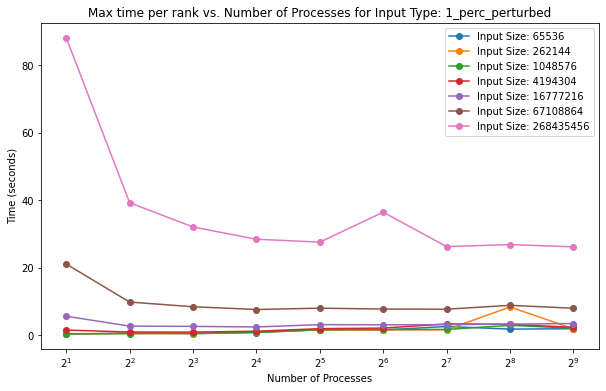

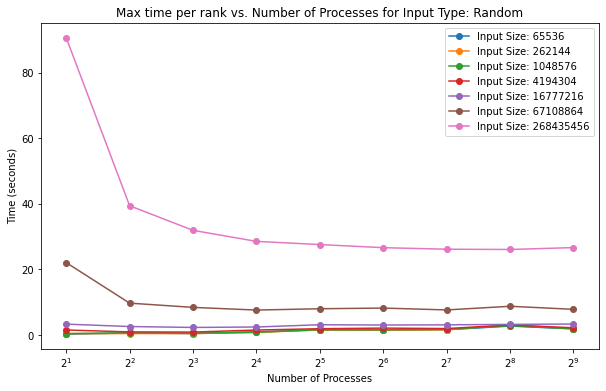

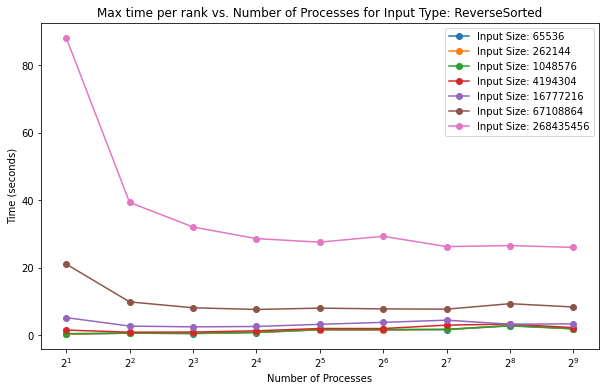

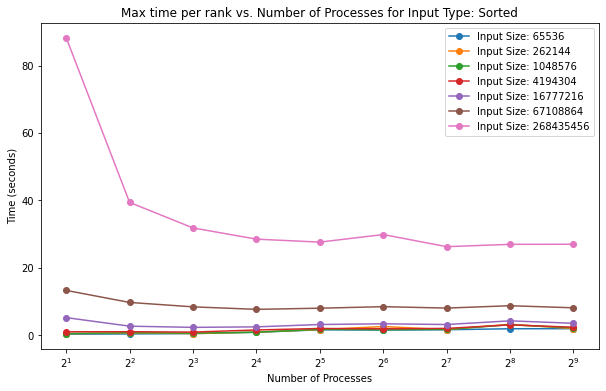

In [33]:
main_df = tk.dataframe.loc[tk.dataframe['name'] == 'main']

# Loop through each input_type
for input_type in input_types:
    plt.figure(figsize=(10, 6))
    title = f"Max time per rank vs. Number of Processes for Input Type: {input_type}"
    plt.title(title)

    # Filter for the current input_type
    input_type_df = main_df.xs(input_type, level='input_type')

    # Plot each line for different input_sizes
    for input_size in input_sizes:
        input_size_df = input_type_df.xs(input_size, level='input_size')

        # Ensure that num_procs and 'Total time' are sorted
#         input_size_df_sorted = input_size_df.loc[num_procs].sort_index()

        # Plot the line
        plt.plot(input_size_df.index.get_level_values('num_procs'), input_size_df['Max time/rank'], label=f'Input Size: {input_size}', marker='o')
    plt.xscale('log', base=2)
    plt.xlabel('Number of Processes')
    plt.ylabel('Time (seconds)')
    plt.legend()
    file = './plots/' + title + '.png'
    file = file.replace(" ", "_")
    plt.savefig(file)
    plt.show()

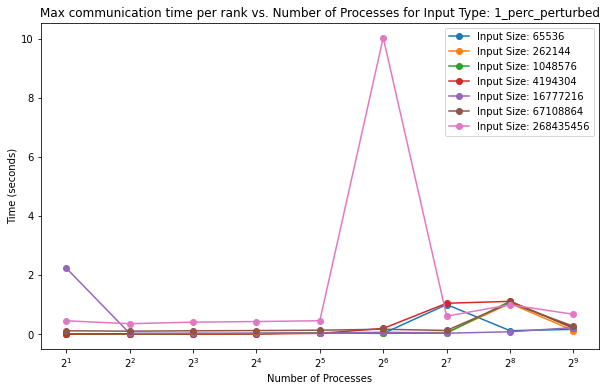

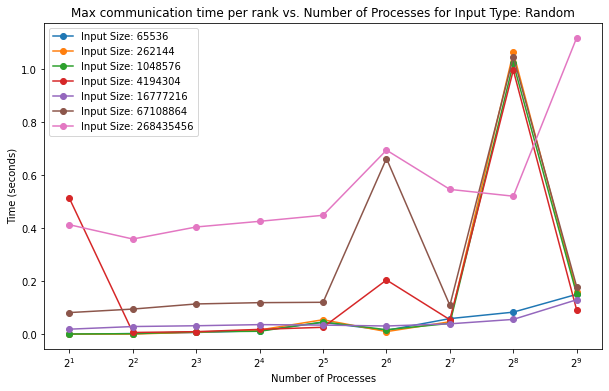

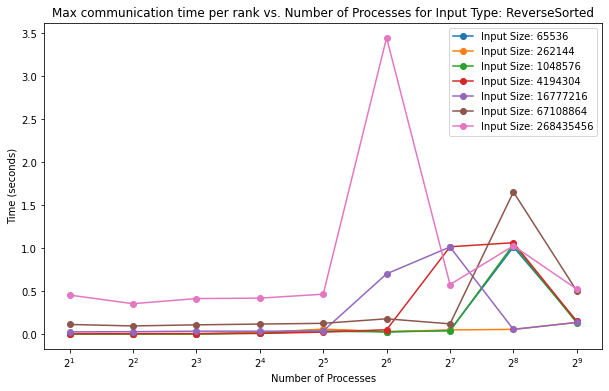

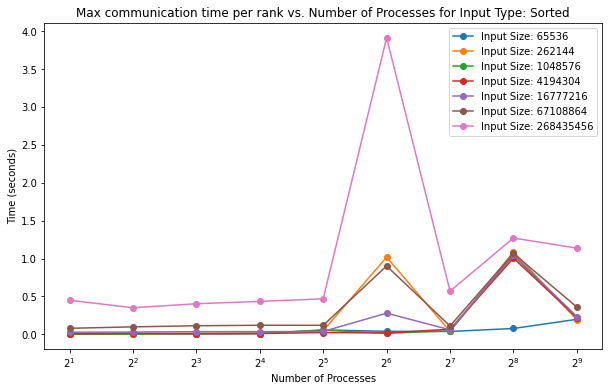

In [9]:
main_df = tk.dataframe.loc[tk.dataframe['name'] == 'comm']

# Loop through each input_type
for input_type in input_types:
    plt.figure(figsize=(10, 6))
    
    title = f"Max communication time per rank vs. Number of Processes for Input Type: {input_type}"
    plt.title(title)

    # Filter for the current input_type
    input_type_df = main_df.xs(input_type, level='input_type')

    # Plot each line for different input_sizes
    for input_size in input_sizes:
        input_size_df = input_type_df.xs(input_size, level='input_size')

        # Ensure that num_procs and 'Total time' are sorted
#         input_size_df_sorted = input_size_df.loc[num_procs].sort_index()

        # Plot the line
        plt.plot(input_size_df.index.get_level_values('num_procs'), input_size_df['Max time/rank'], label=f'Input Size: {input_size}', marker='o')
    plt.xscale('log', base=2)
    plt.xlabel('Number of Processes')
    plt.ylabel('Time (seconds)')
    plt.legend()
    file = './plots/' + title + '.png'
    file = file.replace(" ", "_")
    plt.savefig(file)
    plt.show()

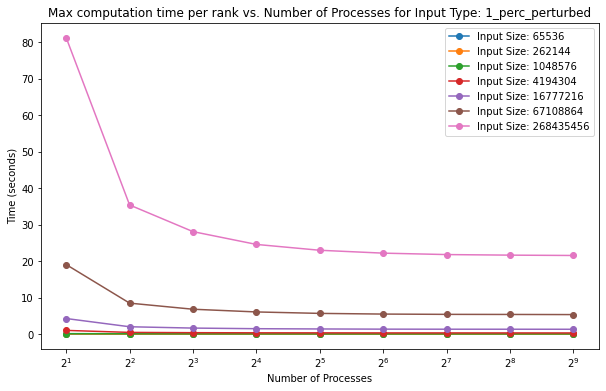

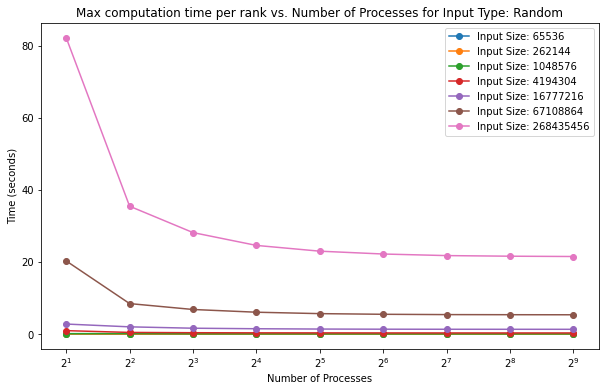

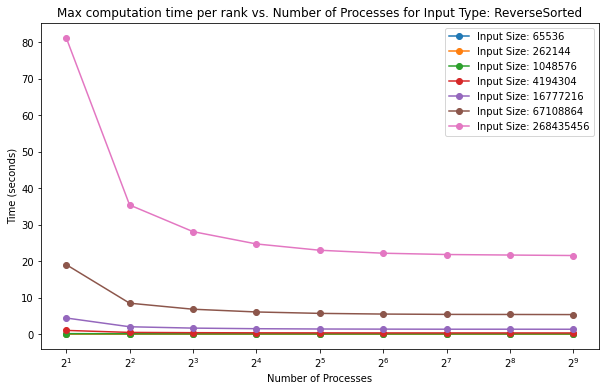

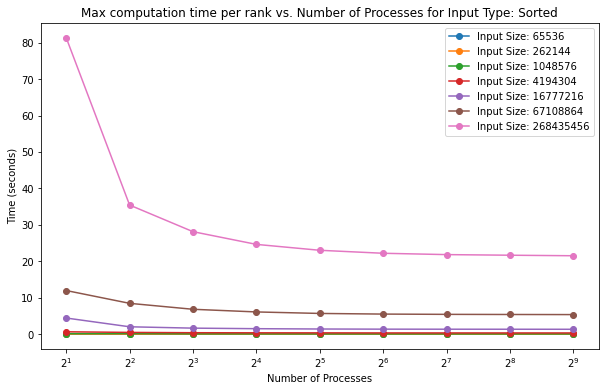

In [35]:
main_df = tk.dataframe.loc[tk.dataframe['name'] == 'comp']

# Loop through each input_type
for input_type in input_types:
    plt.figure(figsize=(10, 6))
    title = f"Max computation time per rank vs. Number of Processes for Input Type: {input_type}"
    plt.title(title)

    # Filter for the current input_type
    input_type_df = main_df.xs(input_type, level='input_type')

    # Plot each line for different input_sizes
    for input_size in input_sizes:
        input_size_df = input_type_df.xs(input_size, level='input_size')

        # Ensure that num_procs and 'Total time' are sorted
#         input_size_df_sorted = input_size_df.loc[num_procs].sort_index()

        # Plot the line
        plt.plot(input_size_df.index.get_level_values('num_procs'), input_size_df['Max time/rank'], label=f'Input Size: {input_size}', marker='o')
    plt.xscale('log', base=2)
    plt.xlabel('Number of Processes')
    plt.ylabel('Time (seconds)')
    plt.legend()
    file = './plots/' + title + '.png'
    file = file.replace(" ", "_")
    plt.savefig(file)
    plt.show()

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os

algorithm = "Merge Sort"

os.makedirs('plots_report', exist_ok=True)

input_sizes = [2**16, 2**18, 2**20, 2**22, 2**24, 2**26, 2**28]
input_types = ['Sorted', 'Random', 'ReverseSorted', '1_perc_perturbed']
num_procs_list = sorted(tk.metadata["num_procs"].unique())
input_sizes_list = [2**i for i in range(16, 29, 2)]

all_data = []

for node in tk.graph.traverse():
    data = tk.dataframe.loc[node]
    if node.frame['name'] not in ['comp', 'comm', 'main']:
        continue

    for input_size in input_sizes:
        for input_type in input_types:
            for num_procs in num_procs_list:
                subset = data[
                    (data['input_size'] == input_size) &
                    (data['input_type'] == input_type) &
                    (data['num_procs'] == num_procs)
                    ]
                if not subset.empty:
                    row = subset.iloc[0]
                    all_data.append({
                        'node': node.frame['name'],
                        'input_size': input_size,
                        'input_type': input_type,
                        'num_procs': num_procs,
                        'total_time': row['Total time'],
                        'avg_time_per_rank': row['Avg time/rank']
                    })

df = pd.DataFrame(all_data)

for node_name in ['comp', 'comm', 'main']:
    for input_size in input_sizes:
        plt.figure(figsize=(10, 6))
        subset = df[(df['node'] == node_name) & (df['input_size'] == input_size)]
        
        for input_type, group in subset.groupby('input_type'):
            sns.lineplot(x='num_procs', y='avg_time_per_rank', data=group, marker='o', label=f'Input Type: {input_type}')
            
        plt.xscale('log', base=2)
        
        plt.xticks(num_procs_list)
        plt.grid(True, which='both', linestyle='--', linewidth=0.7)
        plt.title(f'{algorithm}\nStrong Scaling: {node_name} - Input Size: {input_size}')
        plt.xlabel('Number of Processes')
        plt.ylabel('Average Time per Rank (seconds)')
        plt.legend(title='Input Type')
        plt.tight_layout()
        plt.savefig(f'./plots_report/strong_scaling_{node_name}_{input_size}.png')
        plt.close()
        
for node_name in ['comp', 'comm', 'main']:
    for input_type in input_types:
        plt.figure(figsize=(10, 6))
        subset = df[(df['node'] == node_name) & (df['input_type'] == input_type)]

        for input_size, group in subset.groupby('input_size'):
            group = group.copy()

            baseline = group[group['num_procs'] == 2]
            if baseline.empty:
                continue

            T1 = baseline['avg_time_per_rank'].iloc[0] * 2

            group['speedup'] = T1 / group['avg_time_per_rank']

            sns.lineplot(x='num_procs', y='speedup', data=group, marker='o', label=f'Input Size: {input_size}')

        plt.xscale('log', base=2)
        plt.yscale('log', base=2)
        plt.xticks(num_procs_list)
        plt.grid(True, which='both', linestyle='--', linewidth=0.7)
        plt.title(f'{algorithm}\nStrong Scaling Speedup: {node_name} - {input_type}')
        plt.xlabel('Number of Processes')
        plt.ylabel('Speedup')
        plt.legend(title='Input Size')
        plt.tight_layout()
        plt.savefig(f'./plots_report/speedup_{node_name}_{input_type}.png')
        plt.close()

weak_scaling_data = []

for node in tk.graph.traverse():
    data = tk.dataframe.loc[node]
    if node.frame['name'] not in ['comp', 'comm', 'main']:
        continue

    for num_procs, input_size in zip(num_procs_list[::2], input_sizes_list[2:]):
        for input_type in input_types:
            subset = data[
                (data['num_procs'] == num_procs) &
                (data['input_size'] == input_size) &
                (data['input_type'] == input_type)
                ]
            if not subset.empty:
                row = subset.iloc[0]
                weak_scaling_data.append({
                    'node': node.frame['name'],
                    'input_size': input_size,
                    'input_type': input_type,
                    'num_procs': num_procs,
                    'avg_time_per_rank': row['Avg time/rank']
                })

weak_df = pd.DataFrame(weak_scaling_data)
x_labels = []

for num_procs, input_size in zip(num_procs_list[::2], input_sizes_list[2:]):
    label = f'Procs: {num_procs}\nSize: {input_size}'
    x_labels.append(label)

for node_name in ['comp', 'comm', 'main']:
    for input_type in input_types:
        subset = weak_df[
            (weak_df['node'] == node_name) &
            (weak_df['input_type'] == input_type)
            ]
        if subset.empty:
            continue

        plt.figure(figsize=(10, 6))
        sns.lineplot(
            data=subset,
            x='num_procs',
            y='avg_time_per_rank',
            marker='o',
            label=f'Input Type: {input_type}'
        )

        plt.xscale('log', base=2)
        plt.xticks(ticks=num_procs_list[::2], labels=x_labels)
        plt.grid(True, which='both', linestyle='--', linewidth=0.7)
        plt.title(f'{algorithm}\nWeak Scaling: {node_name} - {input_type}')
        plt.xlabel('')
        plt.ylabel('Average Time per Rank (seconds)')
        plt.tight_layout()
        plt.savefig(f'./plots_report/weak_scaling_{node_name}_{input_type}.png')
        plt.close()